In [1]:
import cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

%matplotlib inline

## 1] View image

#### To view an image using cv2 follow :-

In [2]:
a = 1  # loads a color image array
# a = 0  # loads a grey image array
# a = -1 # loads image including alpha channel 


img1 = cv2.imread('saved/home.jpg',a) 
cv2.imshow('image',img1)
cv2.waitKey(1000)
cv2.destroyAllWindows()

print("img1",f"\nShape : {img1.shape}",f"\nType : {type(img1)}")

img1 
Shape : (1200, 1920, 3) 
Type : <class 'numpy.ndarray'>



## 2] Re-sizing image
### with decrease in fx & fy ,it seems more pixalated 
### or directly give the height and width


Interpolation => assigning values to new pixel positions when resizing or transforming an image

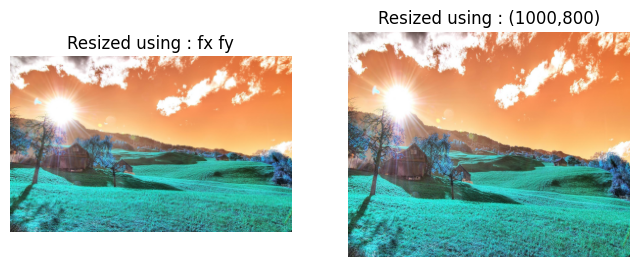

resized_img 155520
resized_img_2 2400000


In [3]:
resized_img = cv2.resize(img1, None,fx=0.15,fy=0.15, interpolation=cv2.INTER_AREA)

# interpolation = INTER_CUBIC , INTER_NEAREST , INTER_LINEAR ,INTER_MAX ,etc.

# instead we can also directly give sizes for eg.
resized_img_2 = cv2.resize(img1, (1000,800))


fig,ax = plt.subplots(1,2,figsize=(8,8))

ax[0].imshow(resized_img)
ax[0].axis('off')
ax[0].set_title('Resized using : fx fy')

ax[1].imshow(resized_img_2)
ax[1].axis('off')
ax[1].set_title('Resized using : (1000,800)')

plt.show()
print('resized_img',resized_img.size)
print('resized_img_2',resized_img_2.size)

## 3] Save image 

cv2.imwrite('desiredname.jpg',source_image_to_be_saved) 

In [4]:
cv2.imwrite('saved/homes.jpg',resized_img)

# or

plt.imsave('saved/homesplt.jpg',resized_img)


## PRACTICE :
Now we will set such that if esc is placed then image won't be stored and if s is pressed image will be stored.

In [5]:
resized_img = cv2.resize(img1, (1500,850), interpolation=cv2.INTER_AREA)
cv2.imshow('image',resized_img)
k = cv2.waitKey(0)
if k == 27:
    cv2.destroyAllWindows()
elif k == ord('s'):
    cv2.imwrite('saved/Headings.jpg',resized_img)
    cv2.destroyAllWindows()

# fig,ax = plt.subplots(figsize=(5,5))
# ax.imshow(resized_img)
# ax.axis('off')
# plt.show()

### Color distribution ( R G B )

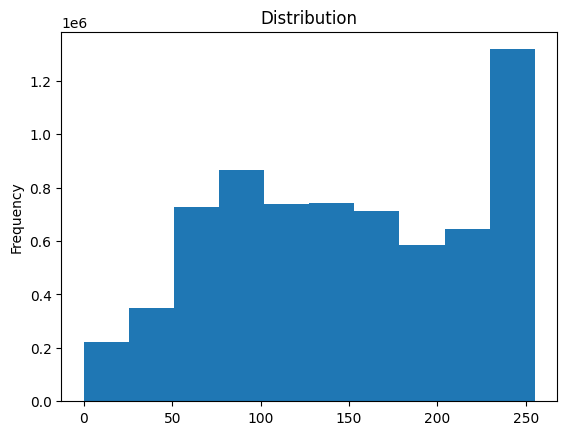

In [6]:
pd.Series(img1.flatten()).plot(kind='hist',title='Distribution')
plt.show()

## 4] cv2 Image vs Original Image

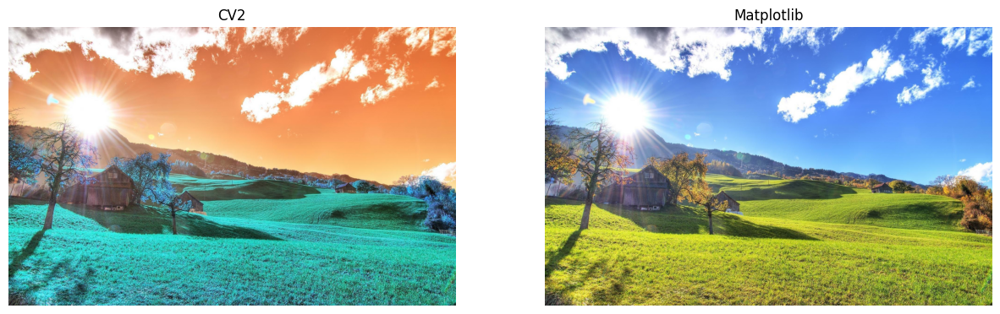

In [7]:
cv2_img = cv2.imread('saved/home.jpg',1)
mpl_img = plt.imread('saved/home.jpg')


fig,ax = plt.subplots(1,2,figsize=(15,5))
ax[0].imshow(cv2_img)
ax[1].imshow(mpl_img)
ax[0].axis('off')
ax[1].axis('off')
ax[0].set_title('CV2')
ax[1].set_title('Matplotlib')
plt.show()

cv2_img = cv2.imread('saved/home.jpg',1)
mpl_img = plt.imread('saved/home.jpg',1)

## 5] Color correcting
BGR to RGB

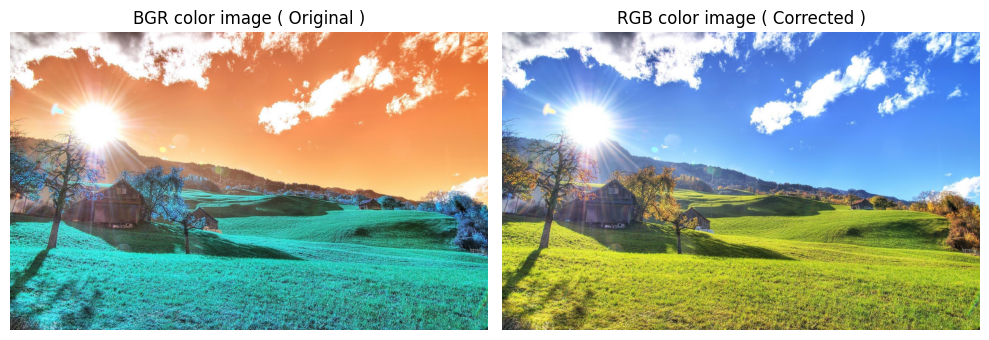

In [8]:
img1 = cv2.imread('saved/home.jpg',1)

corrected_img = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots(1,2,figsize=(10,10))

ax[0].imshow(img1)
ax[0].axis('off')  
ax[0].set_title('BGR color image ( Original )') 
 
ax[1].imshow(corrected_img)
ax[1].axis('off')  
ax[1].set_title('RGB color image ( Corrected )')  
plt.tight_layout()

### Display RGB channels of our image



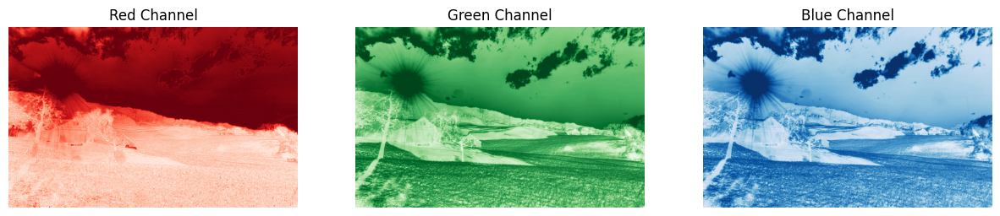

In [9]:

fig,ax = plt.subplots(1,3,figsize=(15,10))
ax[0].imshow(img1[:,:,0], cmap='Reds')
ax[1].imshow(img1[:,:,1], cmap='Greens')
ax[2].imshow(img1[:,:,2], cmap='Blues')

for i in range(0,3):
    ax[i].axis('off') 

ax[0].set_title('Red Channel')
ax[1].set_title('Green Channel')
ax[2].set_title('Blue Channel')
plt.show()

### or Simply splitting them

In [10]:

B, G, R = cv2.split(img1) 
# Corresponding channels are separated 

cv2.imshow("original", img1) 
cv2.waitKey(1000) 

cv2.imshow("blue", B) 
cv2.waitKey(1000) 

cv2.imshow("Green", G) 
cv2.waitKey(1000) 

cv2.imshow("red", R) 
cv2.waitKey(1000) 

cv2.destroyAllWindows() 


### We can also convert it to Gray Scale ( Negatives ) or Pinkish color

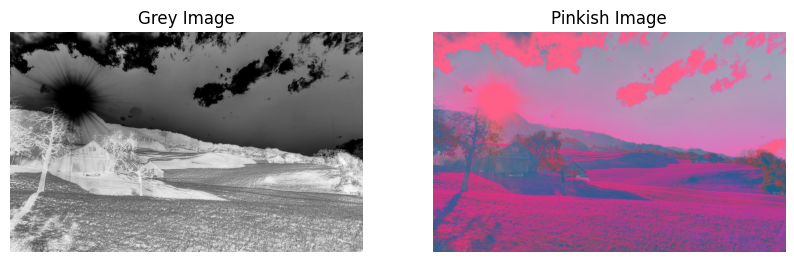

In [11]:
img1 = cv2.imread('saved/home.jpg',1)

img_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
img_luv = cv2.cvtColor(img1, cv2.COLOR_RGB2LUV)
fig ,ax =   plt.subplots(1,2,figsize=(10,10))

ax[0].imshow(img_gray,cmap='Greys')
ax[0].axis('off')  
ax[0].set_title('Grey Image')

ax[1].imshow(img_luv,cmap='Greys')
ax[1].axis('off')  
ax[1].set_title('Pinkish Image')

plt.show()

## 6] Sharpening Image

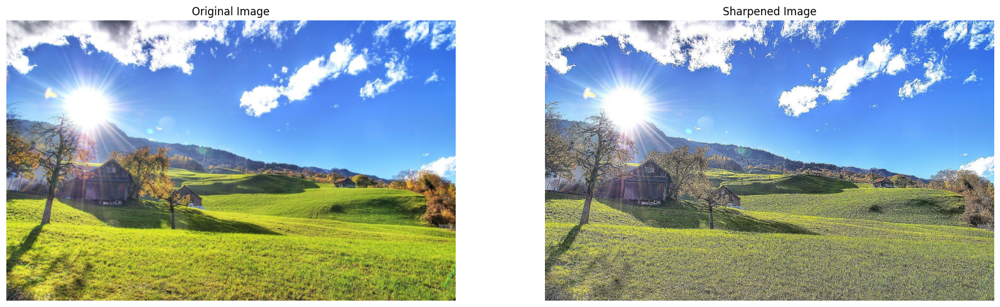

In [12]:
our_image = corrected_img

kernel_sharpening = np.array([[-1 , -1 , -1],
                              [-1 , 9 ,-1],
                              [-1 , -1 , -1]])

sharpened = cv2.filter2D(corrected_img,-1,kernel_sharpening)
fig ,ax =   plt.subplots(1,2,figsize=(20,20))

ax[0].imshow(corrected_img)
ax[0].axis('off')  
ax[0].set_title('Original Image')

ax[1].imshow(sharpened)
ax[1].axis('off')  
ax[1].set_title('Sharpened Image')

plt.show()

## 7] Blurring Image

In [13]:
img = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)      
dst = cv2.GaussianBlur(img, (5, 5), cv2.BORDER_DEFAULT)    

blurred = np.hstack((img, dst))
cv2.imshow("Smoothing", np.hstack((img, dst)))    
cv2.waitKey(0)     
cv2.destroyAllWindows()   

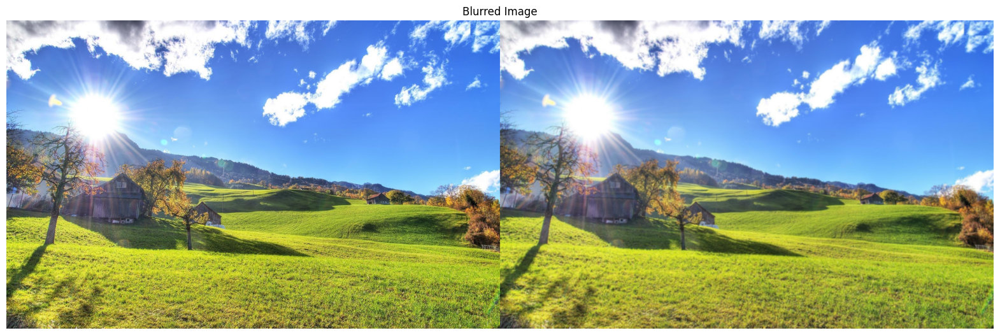

(1200, 1920, 3) (1200, 3840, 3)


In [14]:
im = cv2.imread('saved/home.jpg', 1)      
fig ,ax =   plt.subplots(figsize=(20,20))

ax.imshow(blurred)
ax.axis('off')  
ax.set_title('Blurred Image')

plt.show()
print(im.shape,blurred.shape)

In [15]:
import cv2    
import numpy    
# read image    
im = cv2.imread('saved/home.jpg', 1)      
cv2.imshow('Original Image',im)  
cv2.imshow('Blurred Image', cv2.blur(im, (3,3)))  
cv2.waitKey(0)  
cv2.destroyAllWindows()  

## 8] Removing a certain color from image

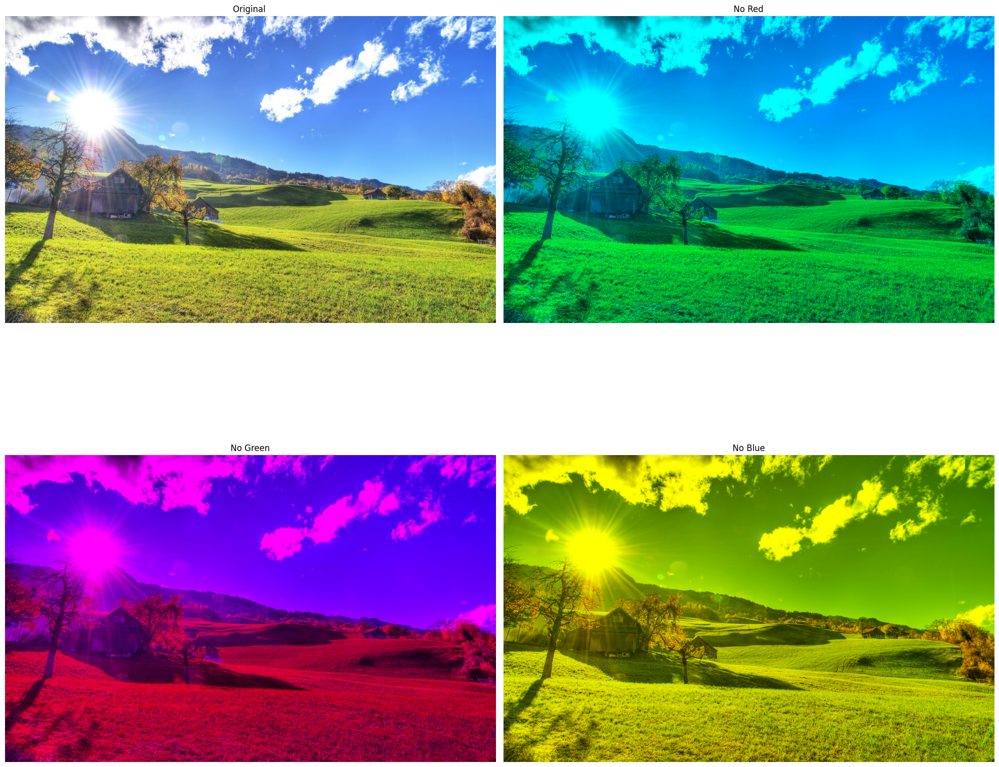

In [16]:
img1 = cv2.imread('saved/home.jpg',1)

corrected_img = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img_r = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img_g = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img_b = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

fig ,ax =   plt.subplots(2,2,figsize=(20,20))


ax[0,0].imshow(corrected_img)
ax[0,0].axis('off')  
ax[0,0].set_title('Original ')

img_r[:,:,0] = 0

ax[0,1].imshow(img_r)
ax[0,1].axis('off')  
ax[0,1].set_title(' No Red ')

img_g[:,:,1] = 0

ax[1,0].imshow(img_g)
ax[1,0].axis('off')  
ax[1,0].set_title(' No Green ')

img_b[:,:,2] = 0

ax[1,1].imshow(img_b)
ax[1,1].axis('off')  
ax[1,1].set_title(' No Blue ')

plt.tight_layout()

## 9] Flipping an image 
(Used to create variation in data to reduce overfitting)

Text(0.5, 1.0, 'Horizontally Flipped Image')

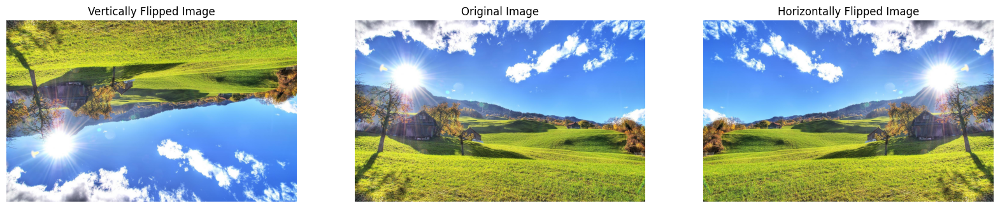

In [17]:
vertical_flip = cv2.flip(corrected_img,0)
horizontal_flip = cv2.flip(corrected_img,1)

fig ,ax =   plt.subplots(1,3,figsize=(20,20))


ax[1].imshow(corrected_img)
ax[1].axis('off')  
ax[1].set_title('Original Image')

ax[0].imshow(vertical_flip)
ax[0].axis('off')  
ax[0].set_title('Vertically Flipped Image')

ax[2].imshow(horizontal_flip)
ax[2].axis('off')  
ax[2].set_title('Horizontally Flipped Image')

## 10] Cropping Image 
( height , width )

slicing starts from topmost and leftmost resp.

In [18]:
corrected_img.shape

(1200, 1920, 3)

Text(0.5, 1.0, 'Cropped Image')

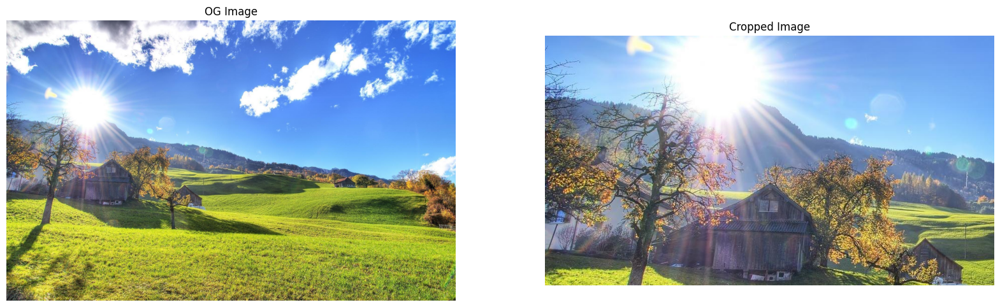

In [19]:
crop_img = corrected_img[300:800,:900]
#                       ( height , width )
fig ,ax =   plt.subplots(1,2,figsize=(20,20))

ax[0].imshow(corrected_img)
ax[0].axis('off')  
ax[0].set_title('OG Image')

ax[1].imshow(crop_img)
ax[1].axis('off')  
ax[1].set_title('Cropped Image')